# Machine Learning

## ¿Qué es?

Es la ciencia de unsar algoritmos para identificar patrones en datos con el fin de resolver un problema de interés. Esto lo logran encontrando patrones en los datos y aprendiendo de las features.

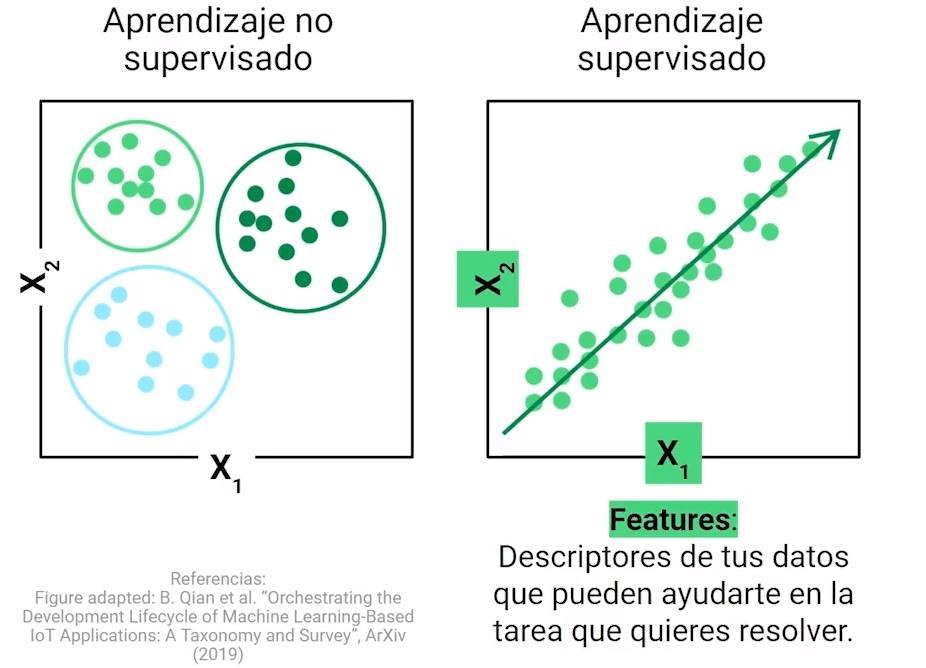

Actualmente el machine learning es usado diariamente, por ejemplo, para detectar si un correo es spam, esto lo hace a partir de datos históricos que detectan que generalmente los correos de spam tienen un enlace, seguramente malicioso.

![timeline](https://static.platzi.com/media/user_upload/Screenshot_1-6eb22d70-674c-4697-8a45-4bdb2192ca7e.jpg)

## Herramientas

- Pandas: Manejo de los datasets.
- Matplotlib, Seaborn, Plotly: Visualización de datos.

### Terminología

|Término|Definición|
|---|---|
|**Data**   |Unidades de información o hechos de observaciones   |
|**Features**   |Tipos de información acerca de las observaciones   |
|**Filas**   |Observación individual   |
|**Columnas**   |Features que describen las observaciones   |
|**Outlier**|Datos que se comportan de forma extraña|
|**Pre-processing**|Preparar los datos para su uso en un modelo de ML|
|**ETL pipeline**|Framework de data science para extraer, transformar y cargar|
|**Target**|Variable que intentamos predecir|

### Tipos de datos

| Tipo de dato | Descripción |
|---|---|
|**Categorical**|Representan una clase o tipo, generalmente se mapean con un one-hot|
|**Numerical**|Es un número de tipo entero o flotante|
|**Image**|Representa una imagen|
|**Text**|Variables de texto|
|**NaN**|Es un valor pérdido o desconocido|

Para trabajar con variables categóricas generalmente se convierten en valores numéricos enteros positivos, como se menciona se usa one-hot, que para cada variable crea un vector binario, en donde el 1 representa la posicion de la clase.

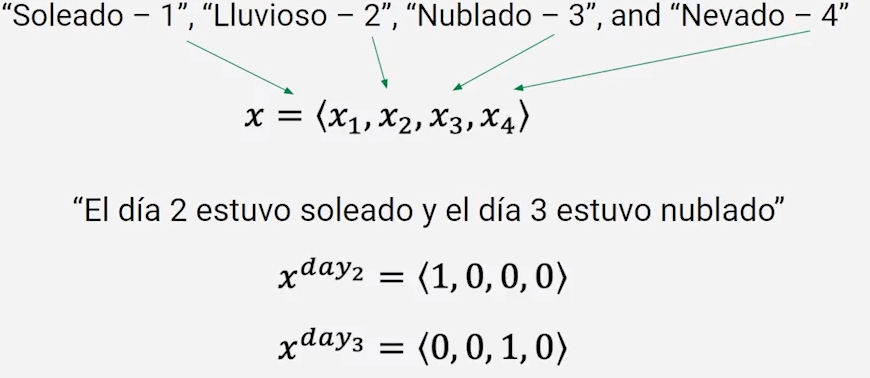

## La "receta" para aplicar algoritmos de machine learning

1. **Proceso de decisión:** cómo los modelos hacen una predicción, o retornan una respuesta, usando parámetros.
2. **Función de error/coste:** c+ómo evaluar si los parámetros en el modelo generan buenas predicciones.
3. **Regla de actualización:** cómo mejorar los parámetros para hacer mejores predicciones (usando optimización numérica)

### Normalización de los datos numéricos
1. Calcular el promedio ($\mu$)
2. Calcular la desviación estándar ($\sigma$)
3. Para cada punto realizar: $$\tilde{x_i}=\frac{x_i-\mu}{\sigma}$$

### Preparar los datos

Los datos se separan:

|Sección   |Porcentaje(%)   |Descripción   |
|---|---|---|
|Training   |60-80   |Datos con los que el modelo aprende patrones   |
|Validation   |0-20   |Datos para verrificar que el modelo aprende   |
|Testing   |0-20   |Datos que se apartan para revisar si el modelo sirve para predecir   |


## Tipos de modelos

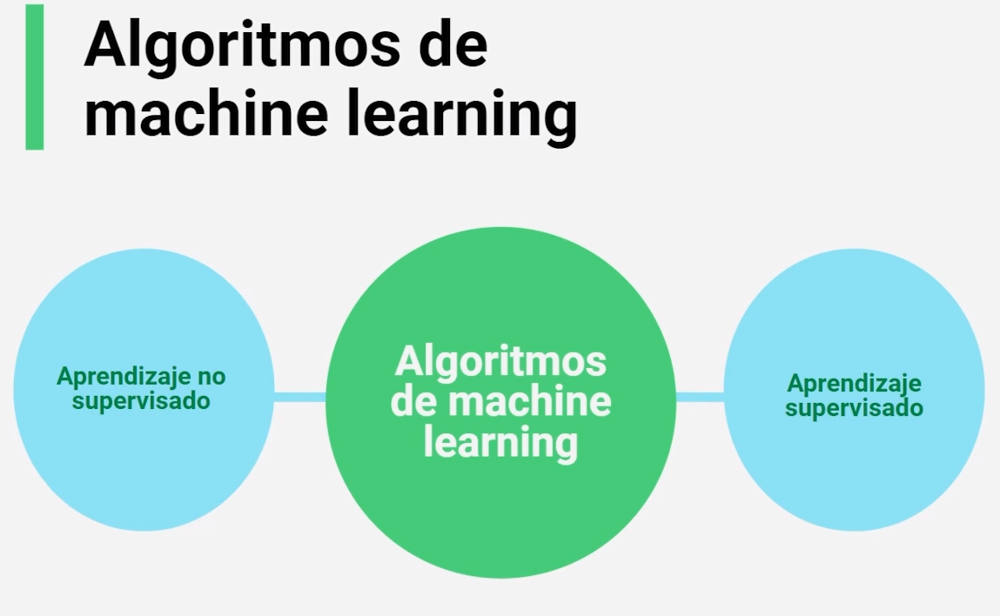

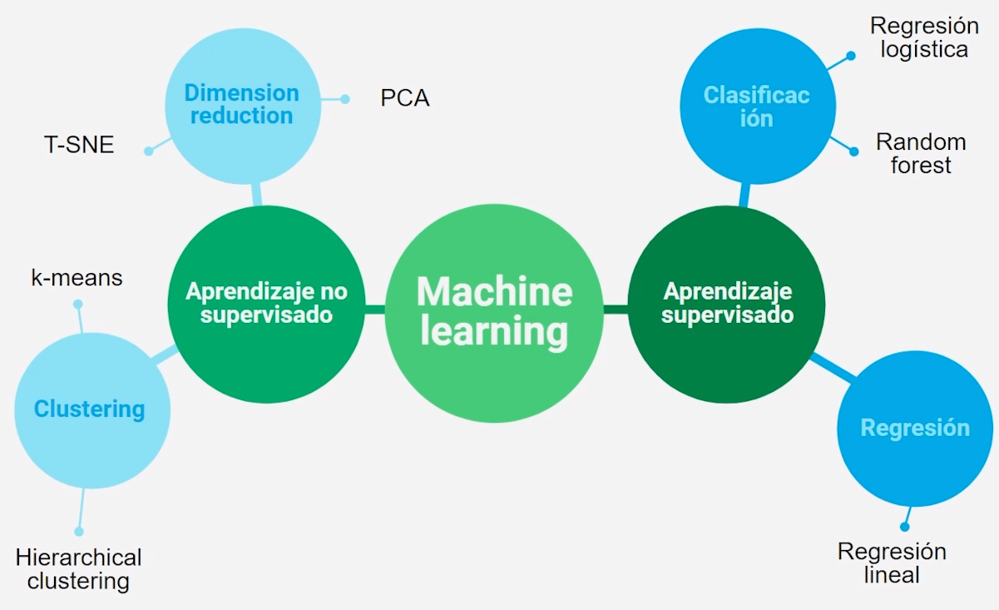



### Supervisado

Son modelos que obtiene features de entrada y salida, lo que significa que hay un target que se desea predecir.

- **Regresión:** El output es numérico.
- **Clasificación:** El output es una etiqueta.

Ejemplos:
- **Regresión Lineal:** Predice valores continuos.
- **Regresión Logística:** Utilizado para clasificación binaria.
- **Árboles de Decisión y Bosques Aleatorios:** Pueden usarse para clasificación y regresión.
- **Máquinas de Soporte Vectorial (SVM):** Para clasificación y regresión.
- **Redes Neuronales:** Ampliamente utilizadas en tareas complejas como el reconocimiento de imágenes y voz.

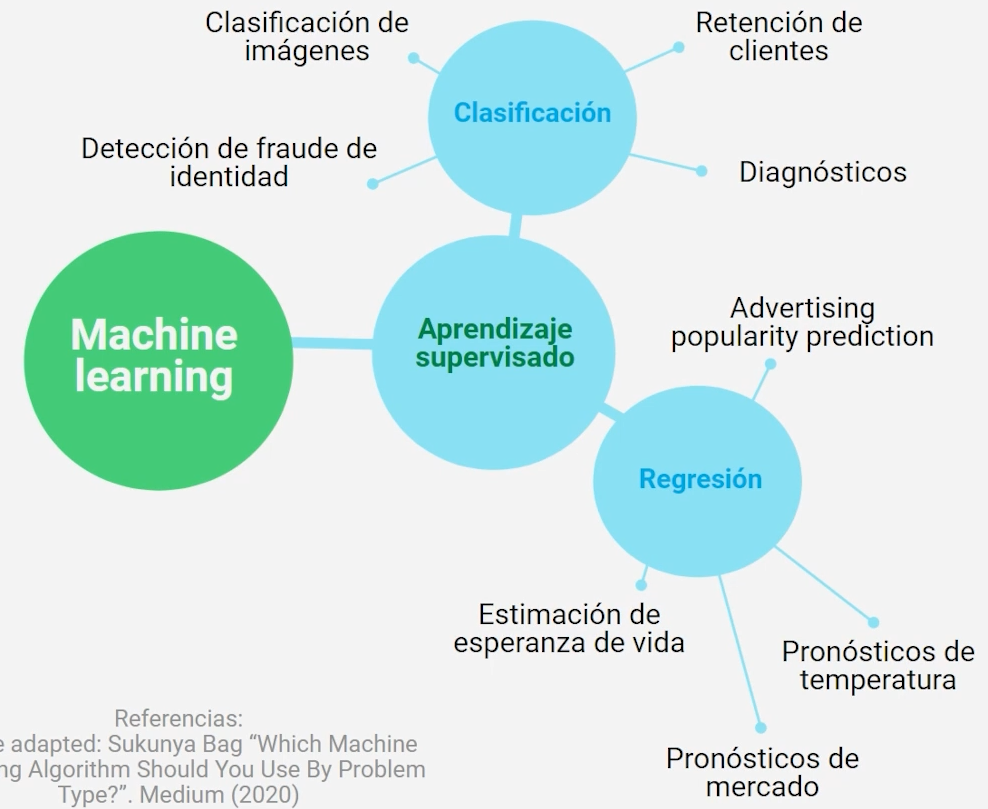

#### Regresión lineal

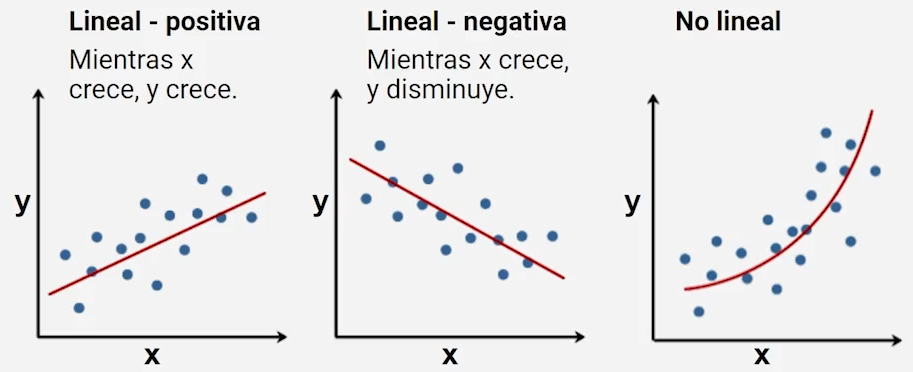

Es un modelo para datos no muy complejos debido a su ecuación, para RLS es:

$$y_{pred}=w_1x+w_o$$

En dónde $w_1$ es la pendiente y $w_0$ es el intercepto.

La fórmula para RLM es:

$$\hat{y}=\beta_0+\beta_1x_1+\beta_2x_2+\dots+\beta_nx_n$$

**Función de coste**

Para esta regresión usamos Mean square Error (MSE) Loss o mínimos cuadrados, busca que el costo o el error sea la diferencia entre el valor verdadero o target ($y_i$) y el valor predicho ($y_{pred}$ o $\hat{y}$)

$$J(w,w_0)=\frac{1}{N}\sum_{i=1}^n(y_i-\hat{y}_i)^2$$

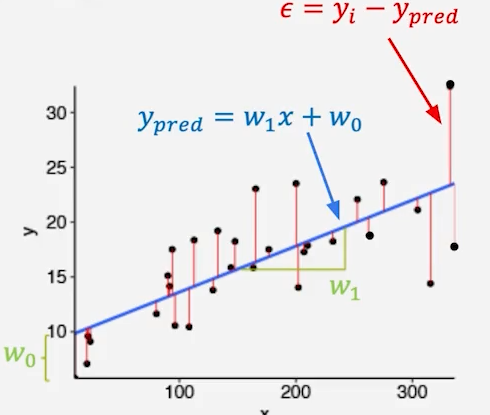

**Regla de actualización**

Se quiere minimizar la distancia $y_{i,pred}$ sobre cada punto, por lo que se cambia $w_0$ y $w_1$ hasta encontrar una suma de menor distancia.

**Rendimiento**

El MSE y el $R^2$ ayudan a identificar la fortaleza de la relación entre features de entrada y de salida.

In [1]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Generar los datos
N = 100

np.random.seed(42)
X = 2 * np.random.rand(N, 1)
y = 4 + 3 * X + np.random.randn(100, 1)

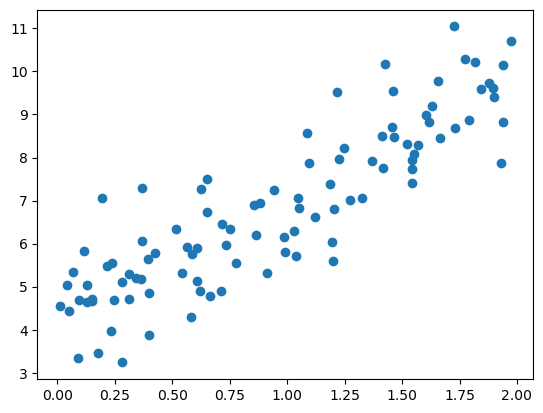

In [3]:
plt.scatter(X, y)

In [4]:
# Dividir los datos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [5]:
modelo_regresion = LinearRegression()

modelo_regresion.fit(X_train, y_train)

LinearRegression()

In [6]:
y_pred = modelo_regresion.predict(X_test)

In [7]:
modelo_regresion.intercept_, modelo_regresion.coef_[0]

(array([4.14291332]), array([2.79932366]))

In [8]:
f"{round(modelo_regresion.intercept_[0], 3)} + {round(modelo_regresion.coef_[0, 0], 3)} x"

'4.143 + 2.799 x'

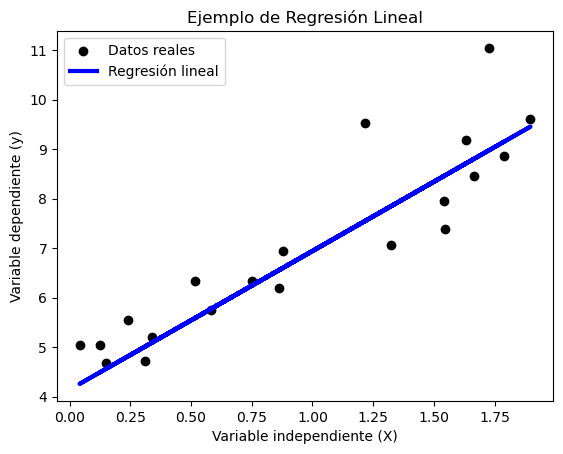

In [9]:
# Visualizar los resultados
plt.scatter(X_test, y_test, color='black', label='Datos reales')
plt.plot(X_test, y_pred, color='blue', linewidth=3, label='Regresión lineal')
plt.xlabel('Variable independiente (X)')
plt.ylabel('Variable dependiente (y)')
plt.title('Ejemplo de Regresión Lineal')
plt.legend()
plt.show()

#### Regresión logística

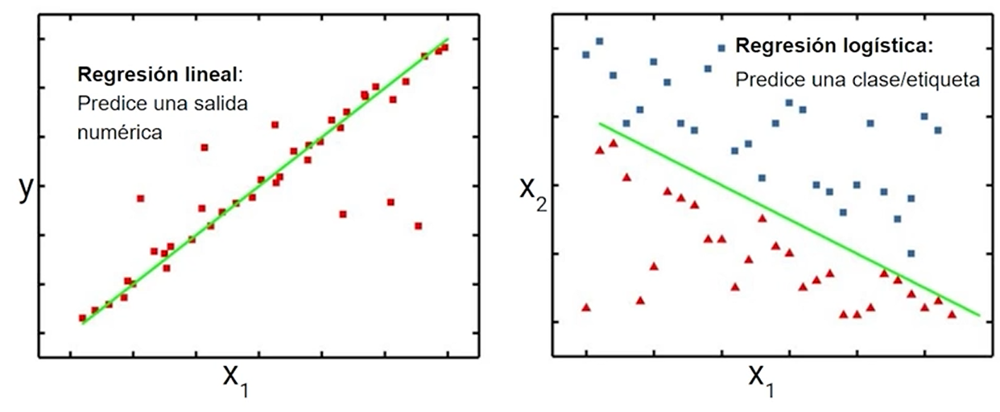

Es un modelo que nos ayuda a clasificar una etiqueta, por ejemplo si se quiere saber si un estudiante pasará o no un examen conociendo cuántas horas estudió

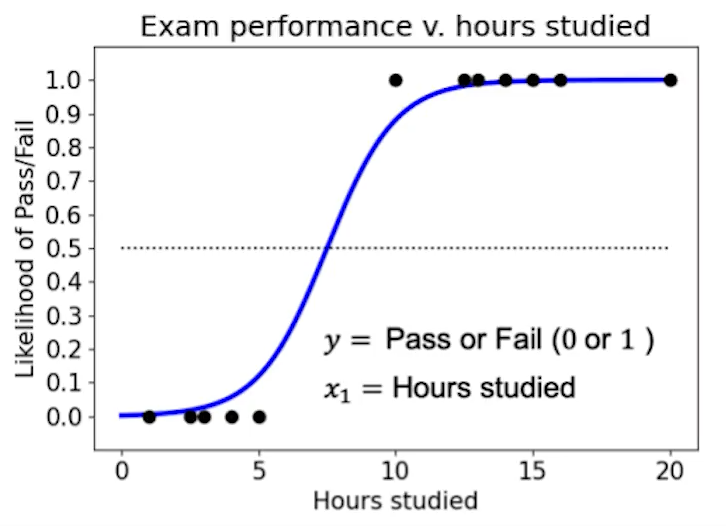

La salida es la probabilidad para cada entrada, para etiquetar decimos que cualquiera sobnre 0.5 pasará:

$$p(y_i)=\frac{exp(w_0+w_1x_1)}{1+exp(w_0+w_1x_1)}$$

**Función de coste**

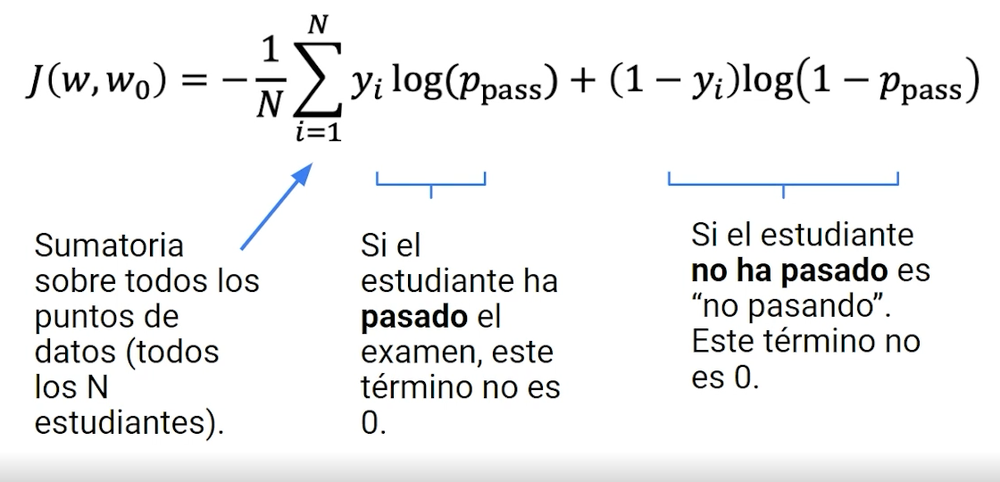

**Regla de actualización**

Encontrar los $w$ y $w_0$ que mejor predicen la probabilidad.

**Rendimiento**

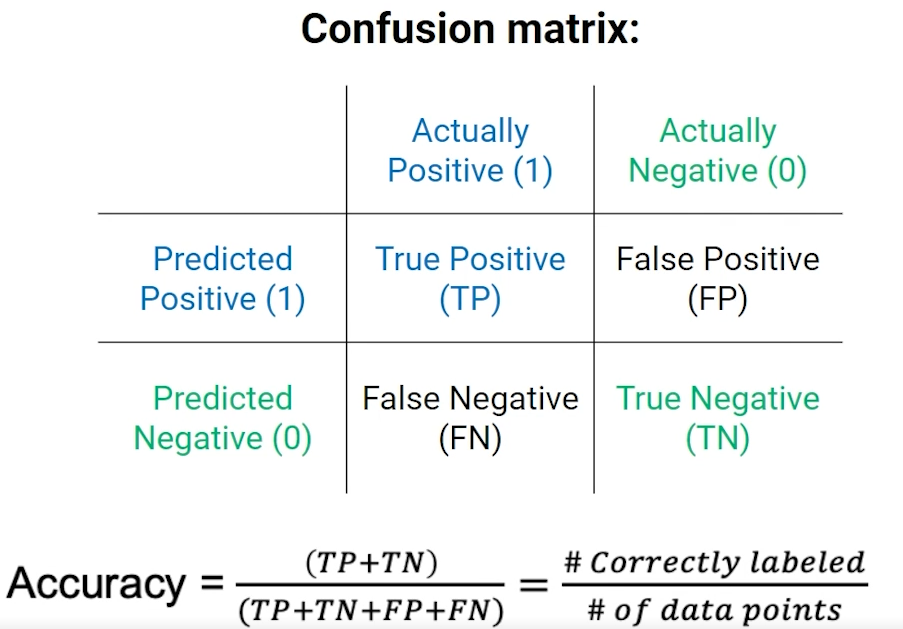

In [10]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

In [11]:
np.random.seed(42)
datos = pd.DataFrame({
    'Variable_1': np.random.rand(100),
    'Variable_2': np.random.rand(100),
    'Variable_3': np.random.choice([0, 1], size=100)
})

# Dividir el conjunto de datos en características (X) y variable objetivo (y)
X = datos[['Variable_1', 'Variable_2']]
y = datos['Variable_3']


In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [13]:
modelo = LogisticRegression()

# Entrenar el modelo con los datos de entrenamiento
modelo.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = modelo.predict(X_test)

In [14]:
exactitud = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

# Imprimir métricas de rendimiento
print(f'Exactitud: {exactitud}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')

Exactitud: 0.55
Precision: 0.6923076923076923
Recall: 0.6428571428571429


In [15]:
confusion_matrix(y_test, y_pred)

array([[2, 4],
       [5, 9]], dtype=int64)

c:\Users\shani\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


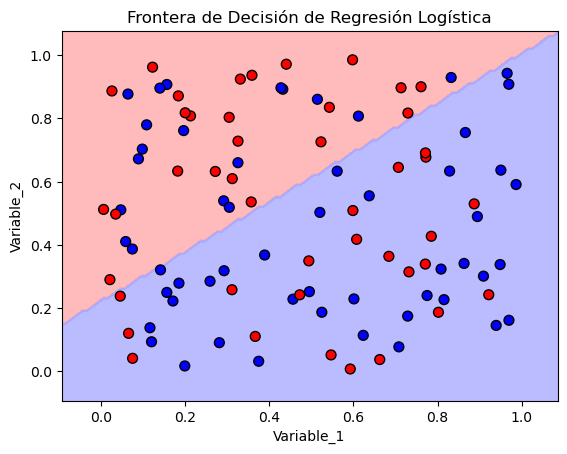

In [16]:
# Crear una malla para la visualización de la frontera de decisión
h = 0.01
x_min, x_max = X.iloc[:, 0].min() - 0.1, X.iloc[:, 0].max() + 0.1
y_min, y_max = X.iloc[:, 1].min() - 0.1, X.iloc[:, 1].max() + 0.1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Predecir la clase para cada punto en la malla
Z = modelo.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Crear un mapa de colores
cmap_fondo = ListedColormap(['#FFAAAA', '#AAAAFF'])
cmap_puntos = ListedColormap(['#FF0000', '#0000FF'])

# Graficar la frontera de decisión y los puntos de datos
plt.contourf(xx, yy, Z, cmap=cmap_fondo, alpha=0.8)
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, cmap=cmap_puntos, edgecolors='k', marker='o', s=50)

# Configuración de la gráfica
plt.title('Frontera de Decisión de Regresión Logística')
plt.xlabel('Variable_1')
plt.ylabel('Variable_2')

# Mostrar la gráfica
plt.show()

#### Árboles de decisión

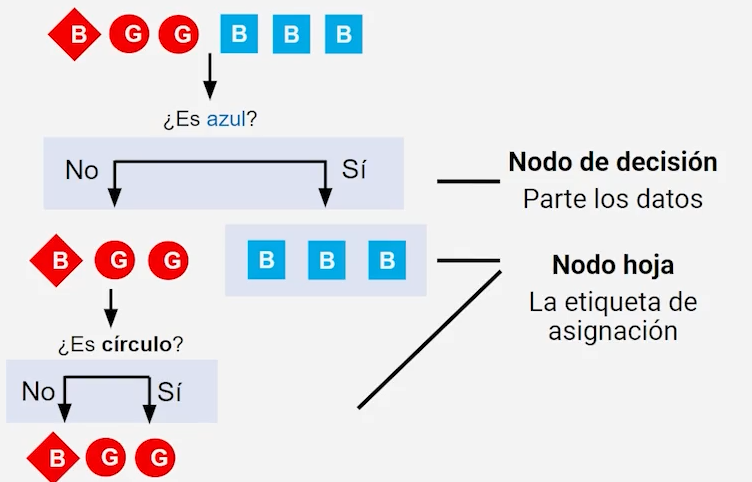

Son modelos que se usan generalmente para clasificación. De este algoritmo surge el Random Forest, que es un conjunto de varios árboles que toman una decisión en conjunto

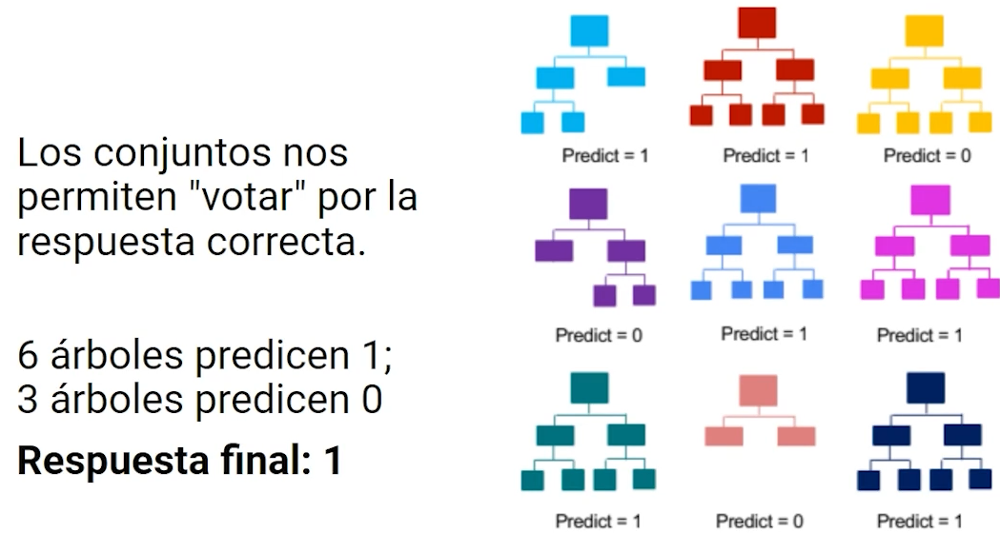

**Parámetros**

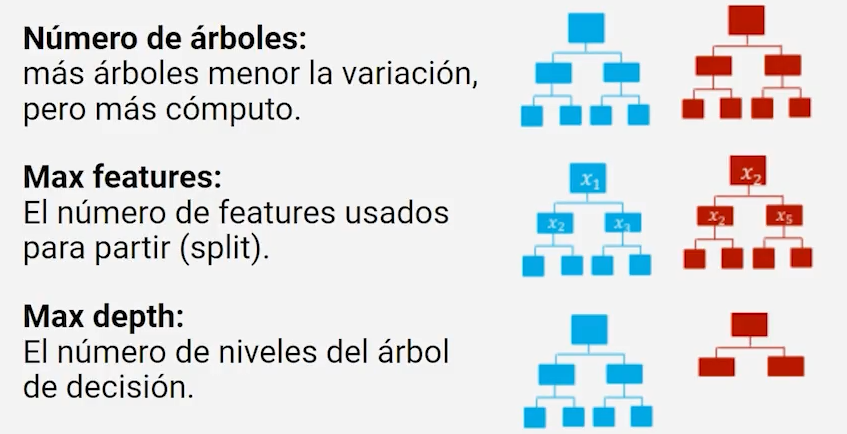

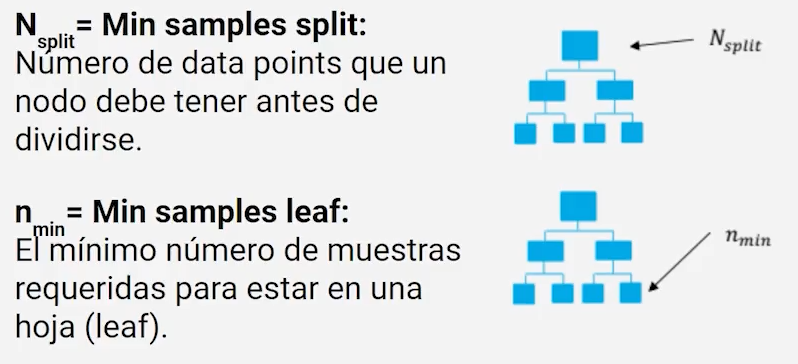

**Función de coste**

Para un feature seleccionado encuentra el mejor split-point y separa los datos en dos nodos más pequeños.

**Regla de actualización**

Si el nodo hoja tiene más de $n_min$ puntos de datos, repite la función de coste, sino para.

**Rendimiento**

Se puede usar confusion matrix para clasificación y para regresión se usa el MSE

In [17]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [18]:
# Importar las bibliotecas necesarias
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.tree import export_text

# Crear un conjunto de datos ficticio para el ejemplo
np.random.seed(42)
datos = pd.DataFrame({
    'Variable_1': np.random.rand(100),
    'Variable_2': np.random.rand(100),
    'Variable_3': np.random.choice([0, 1], size=100)
})

# Dividir el conjunto de datos en características (X) y variable objetivo (y)
X = datos[['Variable_1', 'Variable_2']]
y = datos['Variable_3']

# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Inicializar el modelo de árbol de decisión
modelo_arbol = DecisionTreeClassifier(random_state=42)

# Entrenar el modelo con los datos de entrenamiento
modelo_arbol.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred_arbol = modelo_arbol.predict(X_test)

# Evaluar el rendimiento del modelo de árbol de decisión
exactitud_arbol = metrics.accuracy_score(y_test, y_pred_arbol)
precision_arbol = metrics.precision_score(y_test, y_pred_arbol)
recall_arbol = metrics.recall_score(y_test, y_pred_arbol)

# Imprimir métricas de rendimiento
print(f'Exactitud del Árbol de Decisión: {exactitud_arbol}')
print(f'Precision del Árbol de Decisión: {precision_arbol}')
print(f'Recall del Árbol de Decisión: {recall_arbol}')

# Visualizar la estructura del árbol de decisión
tree_rules = export_text(modelo_arbol, feature_names=list(X.columns))
print("Estructura del Árbol de Decisión:")
print(tree_rules)


Exactitud del Árbol de Decisión: 0.65
Precision del Árbol de Decisión: 0.8181818181818182
Recall del Árbol de Decisión: 0.6428571428571429
Estructura del Árbol de Decisión:
|--- Variable_1 <= 0.93
|   |--- Variable_2 <= 0.90
|   |   |--- Variable_1 <= 0.05
|   |   |   |--- class: 0
|   |   |--- Variable_1 >  0.05
|   |   |   |--- Variable_1 <= 0.17
|   |   |   |   |--- Variable_2 <= 0.13
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- Variable_2 >  0.13
|   |   |   |   |   |--- class: 1
|   |   |   |--- Variable_1 >  0.17
|   |   |   |   |--- Variable_2 <= 0.24
|   |   |   |   |   |--- Variable_2 <= 0.19
|   |   |   |   |   |   |--- Variable_1 <= 0.32
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- Variable_1 >  0.32
|   |   |   |   |   |   |   |--- Variable_1 <= 0.61
|   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- Variable_1 >  0.61
|   |   |   |   |   |   |   |   |--- Variable_2 <= 0.18
|   |   |   |   |   |   |   |   |   |

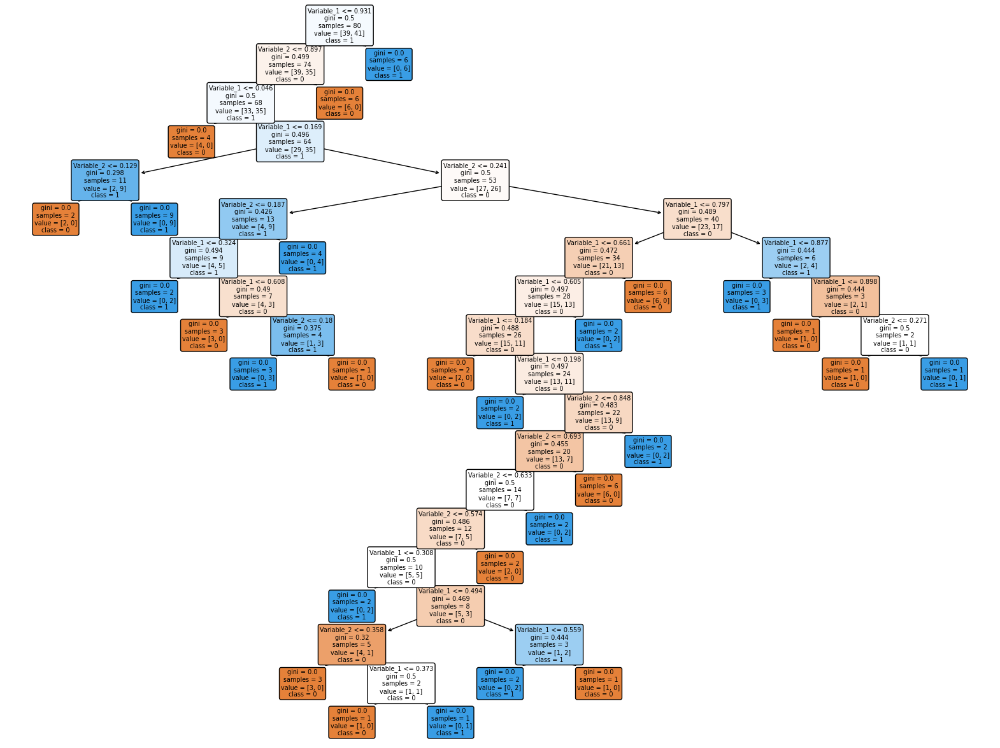

In [19]:
# Importar la biblioteca necesaria para graficar el árbol
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Configurar la gráfica
plt.figure(figsize=(20, 15))

# Graficar el árbol de decisión
plot_tree(modelo_arbol, feature_names=list(X.columns), class_names=['0', '1'], filled=True, rounded=True)

# Mostrar la gráfica
plt.show()

####  Redes neuronales

UNa red neuronal es un modelo que usa neuronas y conexiones entre ellos para hacer predicciones. Se componen de una capa de entrada, múltiples ocultas y una de salida.

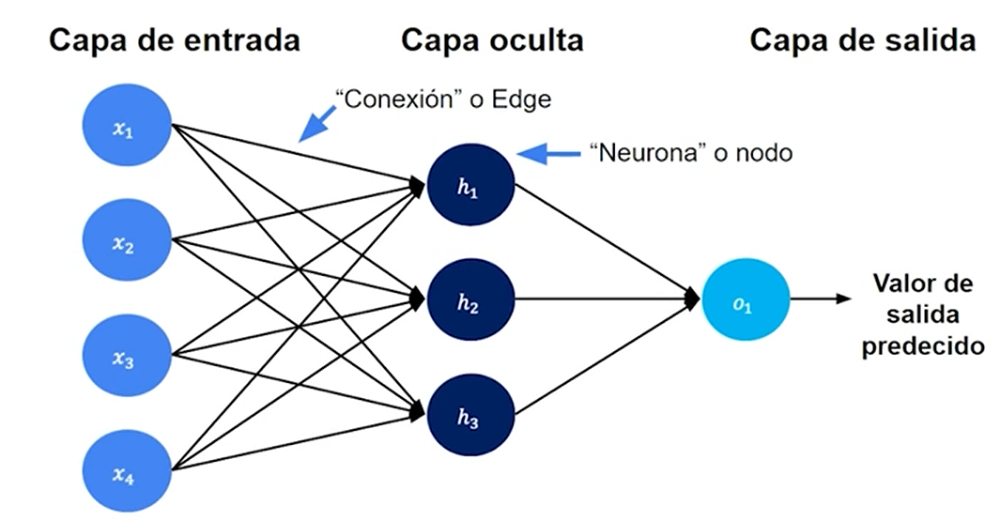

Por ejemplo si se quiere predecir si alguien le gustará un anuncio:

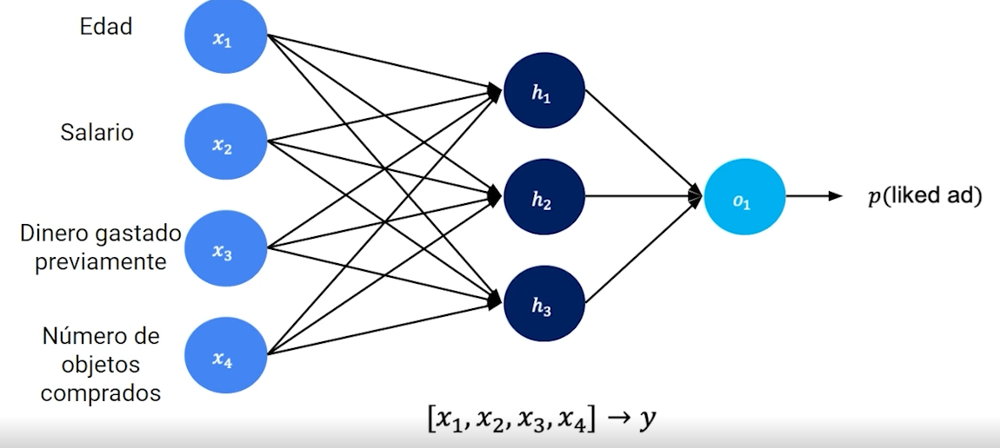

Cada yba de las conexiones de las neuronas son una ecuación donde se multiplica un peso junto al input que recibe la neurona.

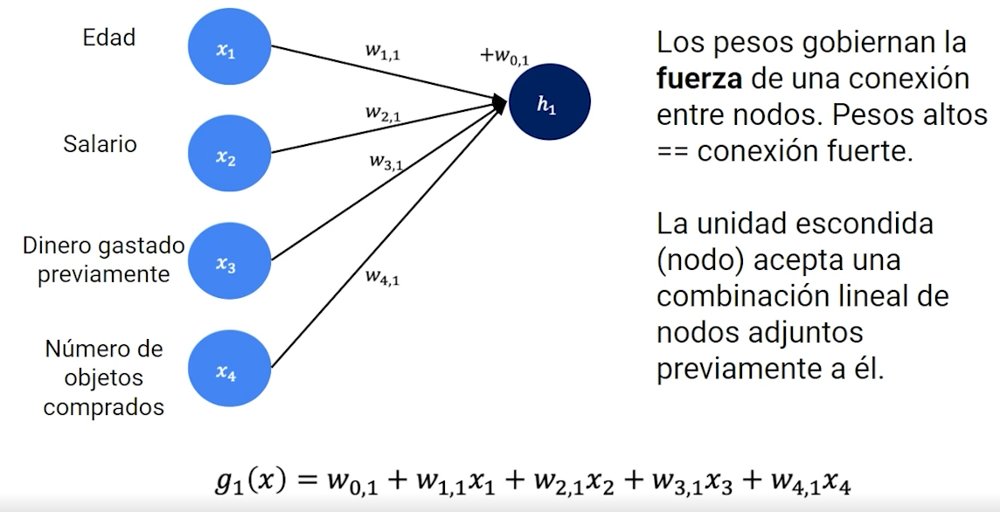

Para llegar a los valores deseados (output), cada capa cuenta con una función de activación, como lo puede ser softmax, ReLu, sigmoid, etc.

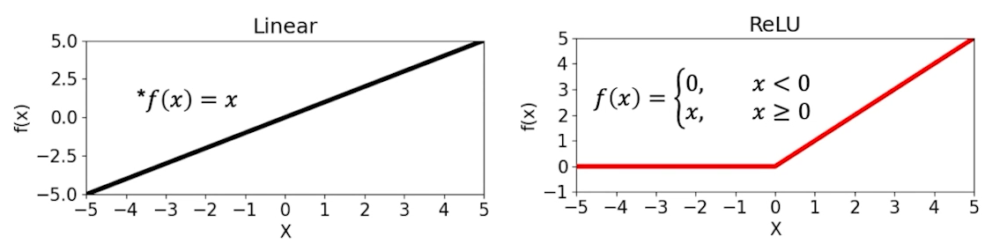

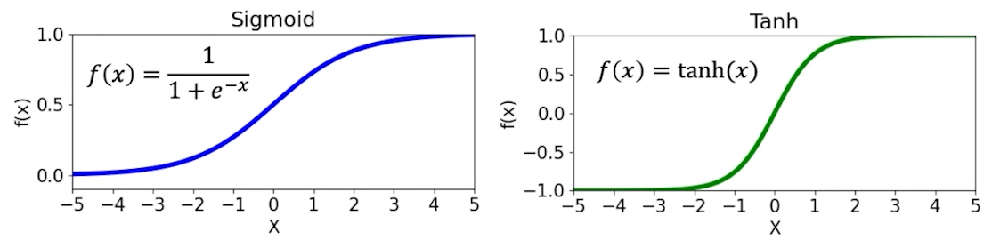

See debe tener cuidado con la complejidad de una red, ya que tiende al overfitting.

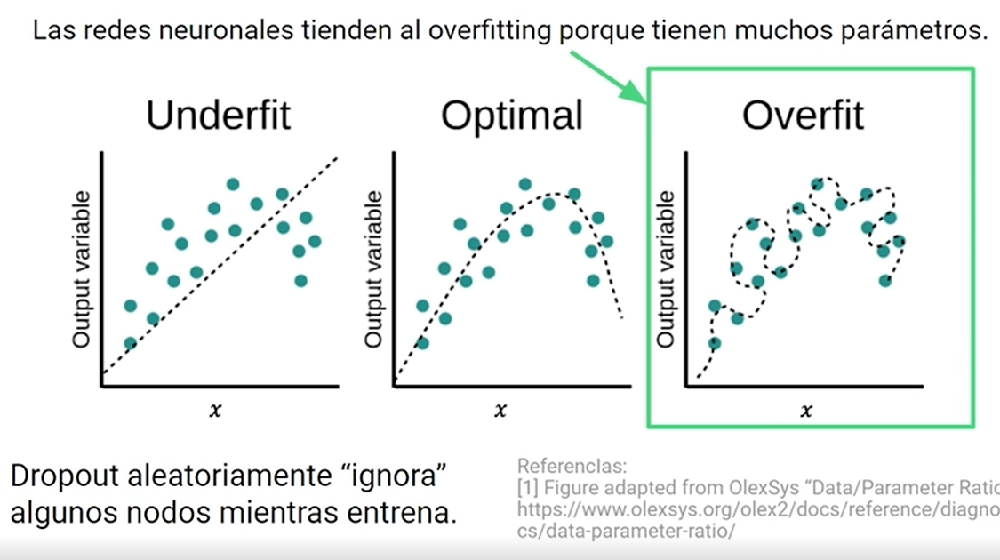

Para evitar esto, se puede ver un grafico del rendimiento del entrenamiento y de validación, para observar en que epocas la validación está más cerca.

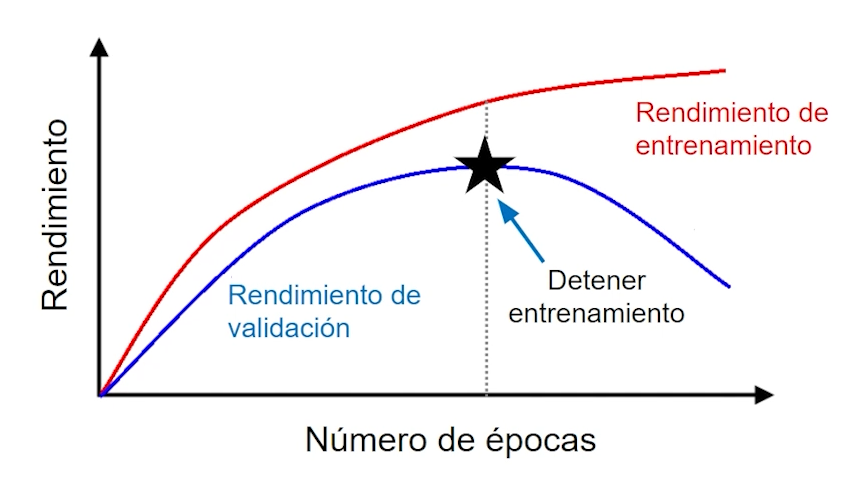

Al asignar pesos a las variables de entrada en un modelo de red neuronal, es importante considerar el impacto relativo que cada variable tiene en la predicción o resultado final. Aquí hay algunos criterios comunes para tomar en cuenta al asignar pesos a las variables de entrada:

Importancia de la variable: Si tienes conocimiento previo o evidencia que sugiere que ciertas variables son más relevantes para el problema en cuestión, puedes asignarles pesos más altos. Esto puede basarse en conocimientos expertos, estudios anteriores o intuiciones sobre la relación entre las variables y el resultado que estás tratando de predecir.

Escala de la variable: Si las variables de entrada tienen diferentes escalas o rangos de valores, es posible que desees normalizar o estandarizar las variables antes de asignar pesos. Esto asegura que las variables se consideren de manera equitativa y no se vean dominadas por aquellas con valores más grandes.

Coeficiente de correlación: Puedes calcular los coeficientes de correlación entre las variables de entrada y la variable de salida. Variables que tengan una correlación más fuerte con la variable de salida pueden recibir pesos más altos, ya que se considera que tienen una mayor influencia en la predicción.

Importancia relativa de la característica: Si las variables de entrada representan diferentes características o aspectos del problema, puedes asignar pesos basados en la importancia relativa de esas características. Por ejemplo, en un problema de detección de fraudes, las características relacionadas con el historial de transacciones pueden considerarse más importantes que las características demográficas.

Es importante tener en cuenta que la asignación de pesos a las variables de entrada puede ser un proceso iterativo y sujeto a ajustes. Puedes probar diferentes asignaciones de pesos, evaluar el rendimiento del modelo y realizar ajustes en función de los resultados.

Además, es importante destacar que la asignación de pesos en una red neuronal también puede realizarse automáticamente a través del proceso de aprendizaje. Los algoritmos de aprendizaje de redes neuronales, como el descenso de gradiente, ajustarán los pesos durante el entrenamiento para minimizar la función de costo y mejorar la precisión del modelo.

##### Tipos de arquiitectura

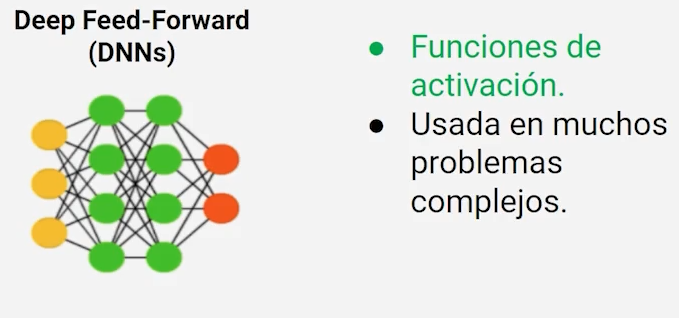

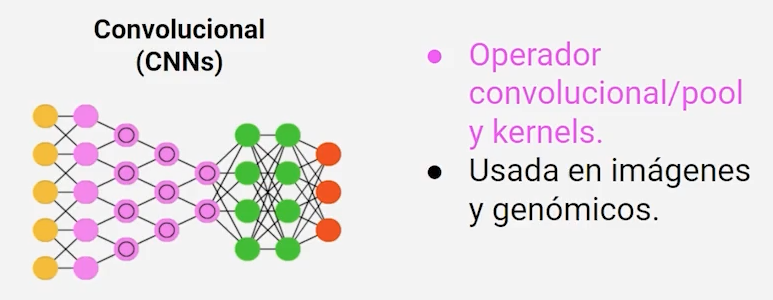

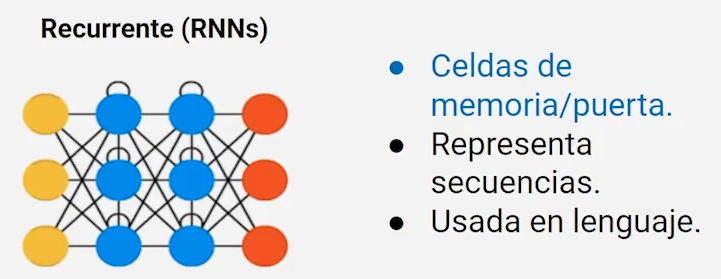

##### Receta

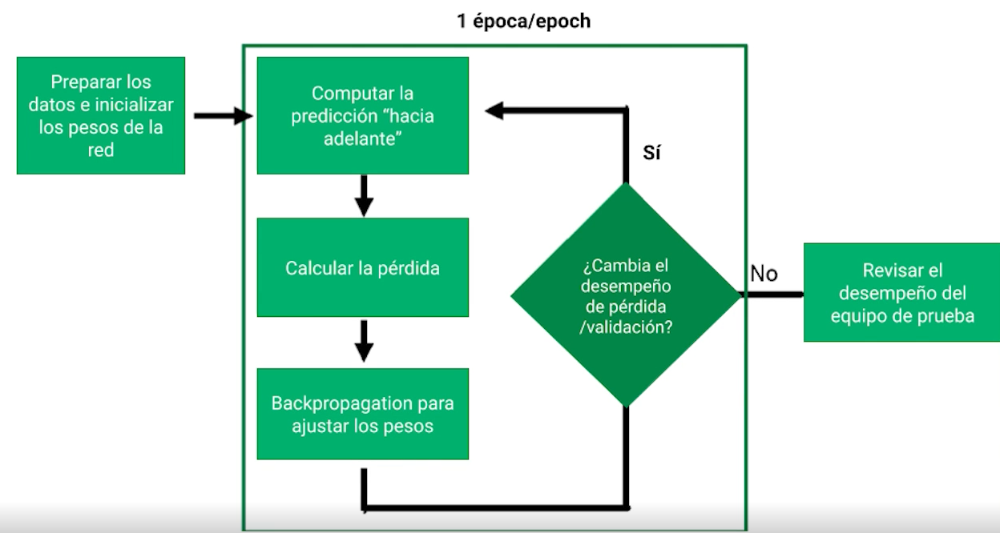

##### Librerías

In [34]:
import numpy as np 
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler 
import tensorflow as tf 
import keras
from keras.models import Sequential 
from keras.layers import Dense

##### Creando datos

In [36]:
edad = np.array([25, 30, 35, 40, 45, 50, 55, 60, 65, 70]) 
salario = np.array([50000, 60000, 70000, 80000, 90000, 100000, 110000, 120000, 130000, 140000]) 
dinero_gastado = np.array([1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]) 
objetos_comprados = np.array([5, 6, 7, 8, 9, 10, 11, 12, 13, 14]) 
gusta_anuncio = np.array([0, 0, 0, 0, 1, 1, 1, 1, 1, 1]) # 0 = No gusta, 1 = Gusta

##### Preprocesamiento de datos

In [37]:
X = np.column_stack((
    edad,
    salario,
    dinero_gastado,
    objetos_comprados
))

y = gusta_anuncio

scaler = StandardScaler()

X = scaler.fit_transform(X)

##### División de datos

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

##### Creación de red neuronal

In [39]:
model = Sequential() 
model.add(Dense(16, input_dim=4, activation='relu')) 
model.add(Dense(1, activation='sigmoid'))

##### Compilación y entrenamiento

In [40]:
model.compile(
    loss='binary_crossentropy', 
    optimizer='adam', 
    metrics=['accuracy']
) 
model.fit(X_train, y_train, epochs=100, batch_size=8)


Epoch 1/100


1/1 [==============================] - 2s 2s/step - loss: 0.8060 - accuracy: 0.1250
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 0.7987 - accuracy: 0.1250
Epoch 3/100
1/1 [==============================] - 0s 14ms/step - loss: 0.7914 - accuracy: 0.1250
Epoch 4/100
1/1 [==============================] - 0s 13ms/step - loss: 0.7843 - accuracy: 0.1250
Epoch 5/100
1/1 [==============================] - 0s 9ms/step - loss: 0.7774 - accuracy: 0.2500
Epoch 6/100
1/1 [==============================] - 0s 11ms/step - loss: 0.7705 - accuracy: 0.2500
Epoch 7/100
1/1 [==============================] - 0s 9ms/step - loss: 0.7637 - accuracy: 0.3750
Epoch 8/100
1/1 [==============================] - 0s 12ms/step - loss: 0.7569 - accuracy: 0.5000
Epoch 9/100
1/1 [==============================] - 0s 10ms/step - loss: 0.7501 - accuracy: 0.6250
Epoch 10/100
1/1 [==============================] - 0s 12ms/step - loss: 0.7434 - accuracy: 0.6250
Epoch 11/100
1/1 [==

##### Evaluación

In [41]:
loss, accuracy = model.evaluate(X_test, y_test) 
print('Precisión del modelo:', accuracy)

1/1 [==============================] - 0s 343ms/step - loss: 0.2650 - accuracy: 1.0000
Precisión del modelo: 1.0


##### Predicción

In [42]:
nueva_persona = np.array([[35, 75000, 5000, 6]]) 
nueva_persona = scaler.transform(nueva_persona) 
prediccion = model.predict(nueva_persona) 
print('Predicción:', prediccion)

1/1 [==============================] - 0s 167ms/step
Predicción: [[0.39206725]]


### No supervisado

El objetivo es desconocido, se desea encontrar grupos y estructuras en los datos.

- **Clustering:** Encontrar los grupos
- **Dimensional reduction:** Encontrar qué features de entrada son de ayuda

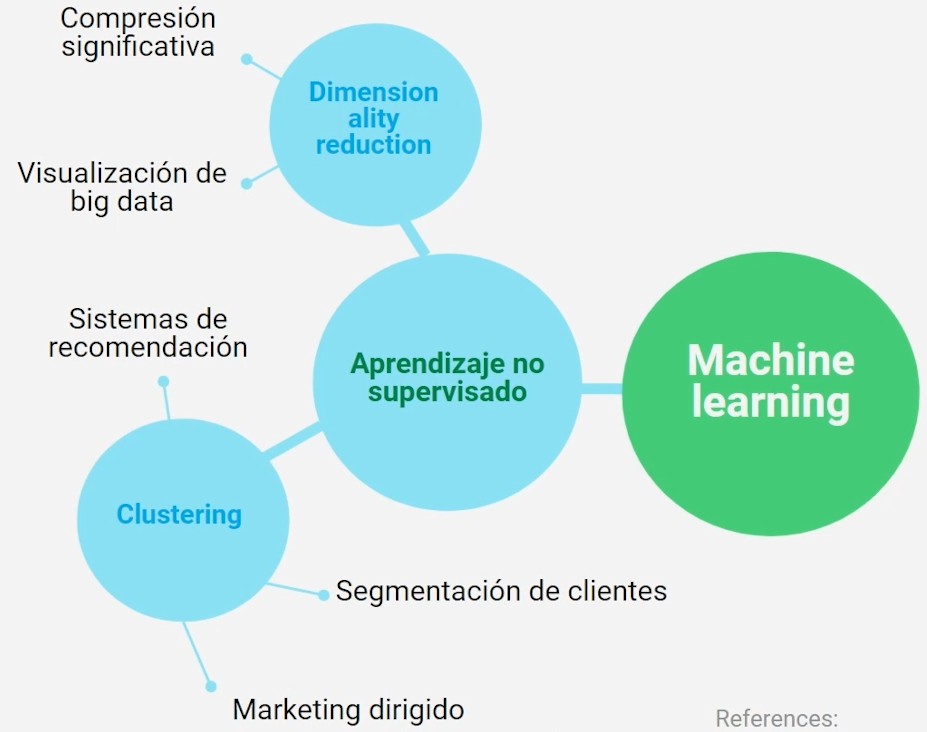

#### K-Means clustering

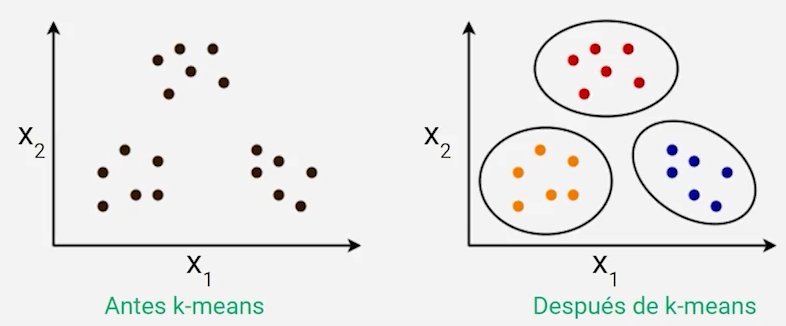

Este modelo tiene como objetivo agrupar los datos según sus caracteristicas, esto lo colocando K centroides de forma aleatoria

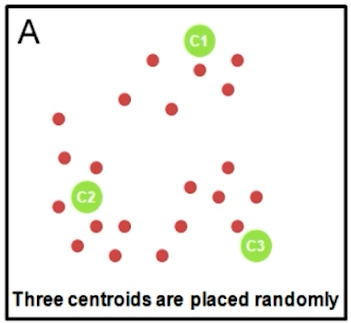

Luego, se asignan los puntos al centroide más cercano

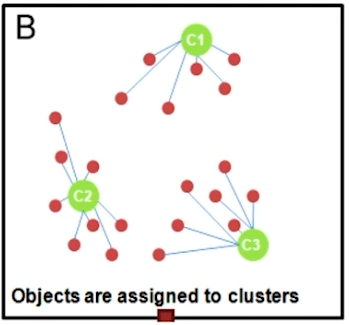

Después de esto los centroides se mueven a otra localización en base a su grupo de puntos

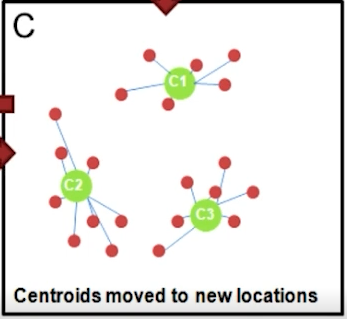

Esto genera un nuevo cluster, por lo que el proceso se repite hasta que no hay cambios en los clusters

**Función de coste**

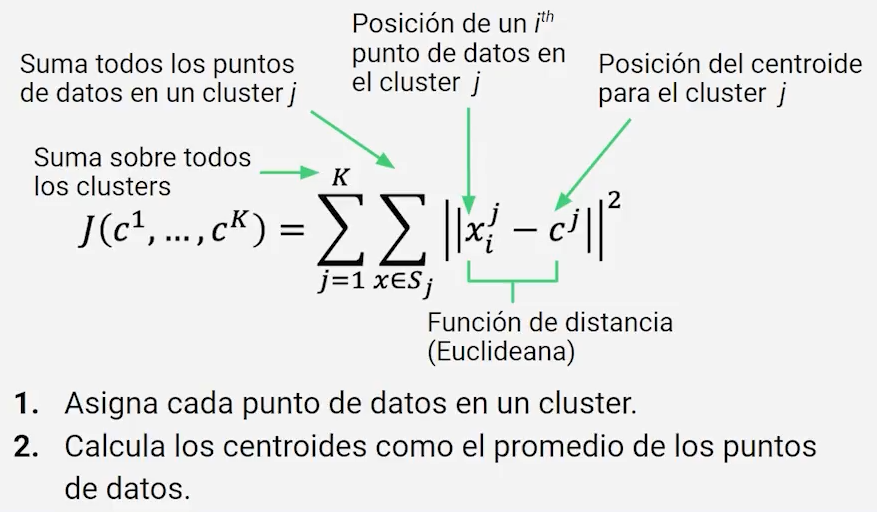

**Regla de actualización**

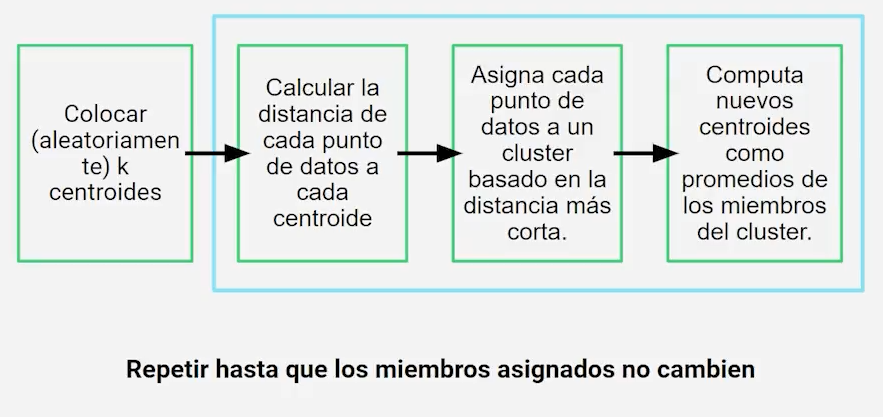

**Rendimiento**

Para 1 solo modelo:

**Inertia**: Qué tan cerca están los puntos de datos al centroide. Se busca un número pequeño.

**Solhoutte score**: Qué tan lejos son los clusters, de [-1, 1]. Este número debe ser cercano a 1

**Codo**

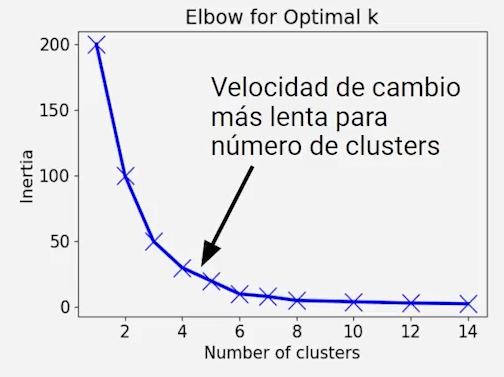

In [20]:
!set OMP_NUM_THREADS=2

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer

In [22]:
# 500 datos; std de los clusters de 0.8, 4 clusters; 2 características; retornar los Centroides
X, y, centroids = make_blobs(
    n_samples = 500, 
    cluster_std = 0.8, 
    centers = 4, 
    n_features = 2, 
    return_centers = True)

In [23]:
# Datos
df = pd.DataFrame({
    "x1" : X[:, 0],
    "x2" : X[:, 1],
    "y" : y
})

# Centroides
dfCentroids = pd.DataFrame({
    "x1" : centroids[:, 0],
    "x2" : centroids[:, 1]
})
df.head()

,x1,x2,y
0,6.937109,-4.489754,1
1,7.284275,-3.836840,1
2,6.815060,-4.864074,1
3,-4.313077,-3.296272,0
4,7.718418,-2.577050,1


In [24]:
df["y"].unique()

array([1, 0, 2, 3])

In [25]:
dfCentroids.head()

,x1,x2
0,-4.111022,-2.298045
1,7.022733,-3.661560
2,-6.610145,1.136025
3,8.723095,3.920596


##### Visualización

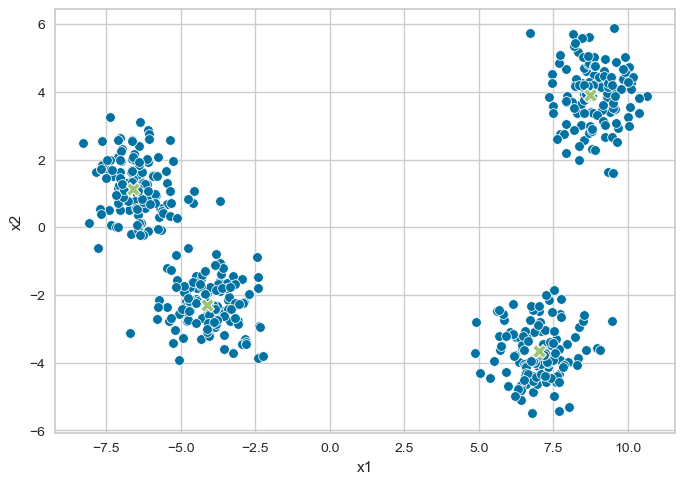

In [26]:
# Los puntos del conjunto de datos
sns.scatterplot(
    data = df,
    x = "x1",
    y = "x2"
)
# Centroides iniciales
sns.scatterplot(
    data = dfCentroids,
    x = "x1",
    y = "x2",
    marker = "X",
    s = 100
)
plt.show()

##### Aplicando K-Means

In [27]:
def plotClusters(k):
    # Creamos el modelo con k clusters
    kmeans = KMeans(n_clusters = k, max_iter = 100000, n_init="auto")
    # Entrenamos el modelo y hacemos la clusterización y los guardamos en un df
    dfCluster = kmeans.fit_predict(X)
    # Añadimos una columna al conjunto de datos para especificar a qué cluster pertenece en base a la predicción
    df["Cluster"] = dfCluster
    # Guardamos los centroides de la predicción para luego graficar
    kmeansCenters = kmeans.cluster_centers_
    dfKmeansCenters = pd.DataFrame({
        "x1" : kmeansCenters[:, 0],
        "x2" : kmeansCenters[:, 1]
    })
    
    plt.figure(figsize = (10, 10))
    # Datos
    sns.scatterplot(
        data = df,
        x = "x1",
        y = "x2",
        hue = "Cluster",
        palette = "bright"
    )
    # Centroides originales
    sns.scatterplot(
        data = dfCentroids,
        x = "x1",
        y = "x2",
        marker = "X",
        color = "green",
        s = 150
    )
    # Centroides predicción
    sns.scatterplot(
        data = dfKmeansCenters,
        x = "x1",
        y = "x2",
        marker = "o",
        color = "orange",
        s = 150
    )
    # Añadimos el título para saber el número de clusters
    plt.title(f"{k} Clusters")
    plt.show()

c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


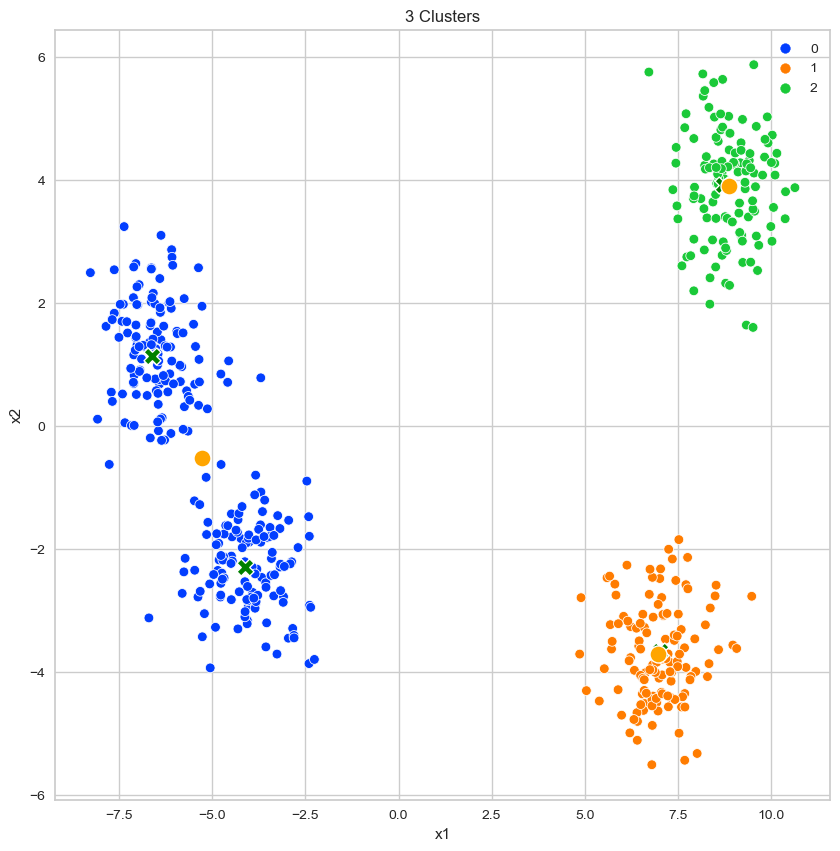

In [28]:
plotClusters(3)

c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


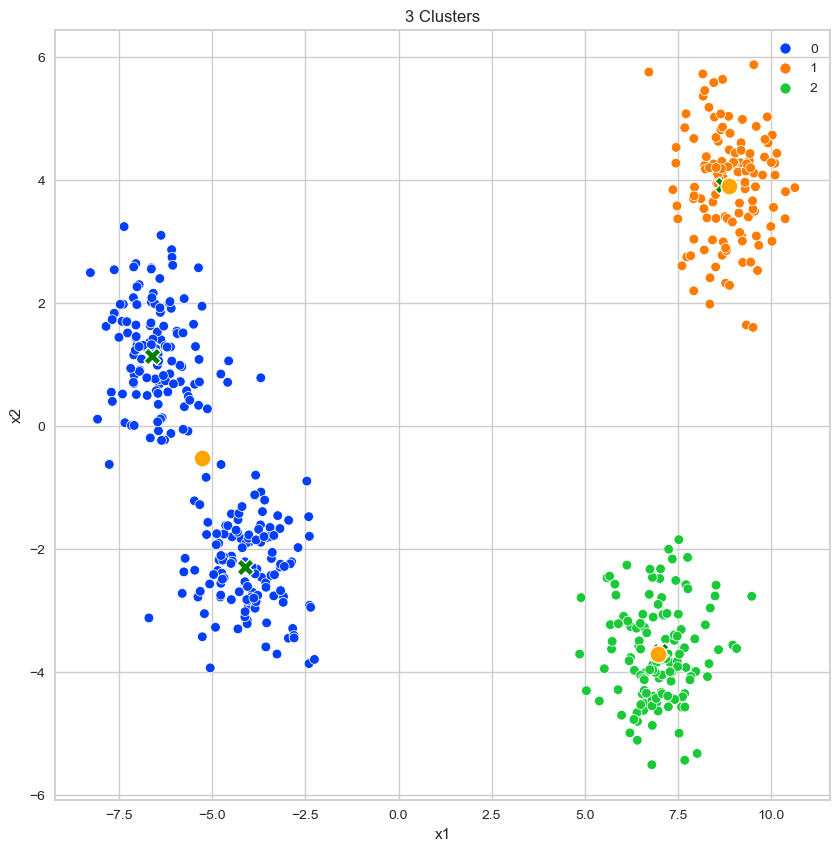

c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


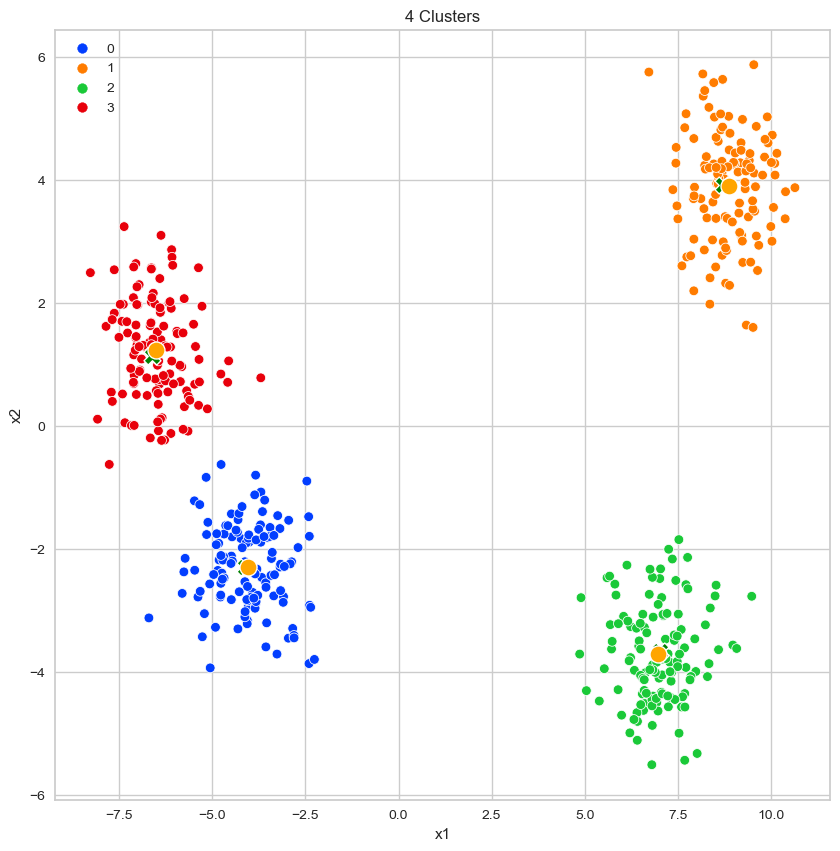

c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


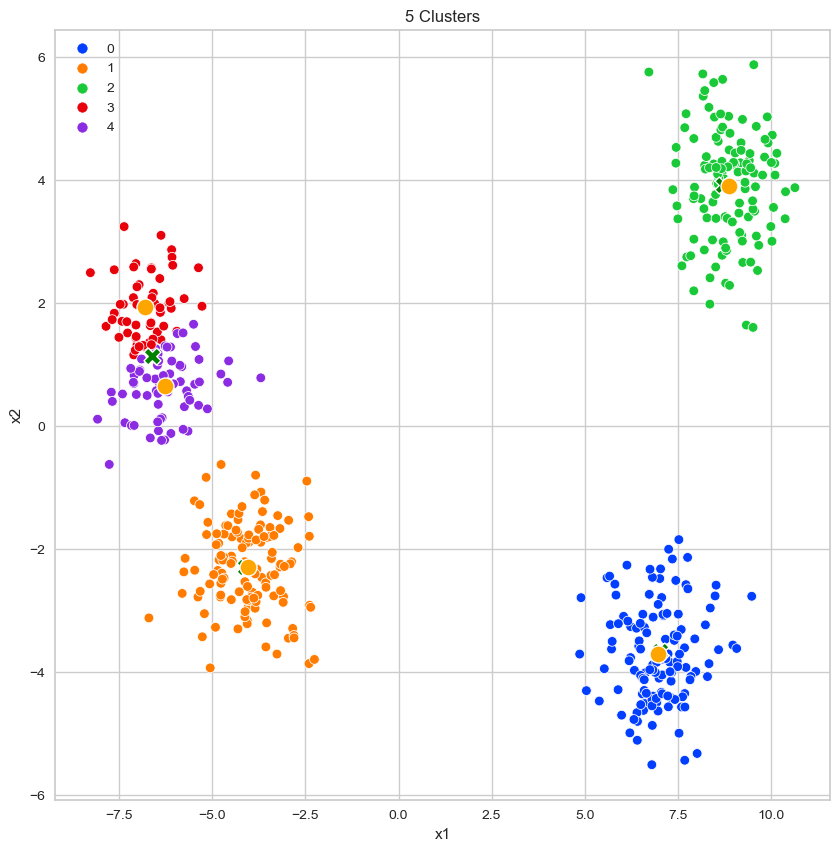

c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


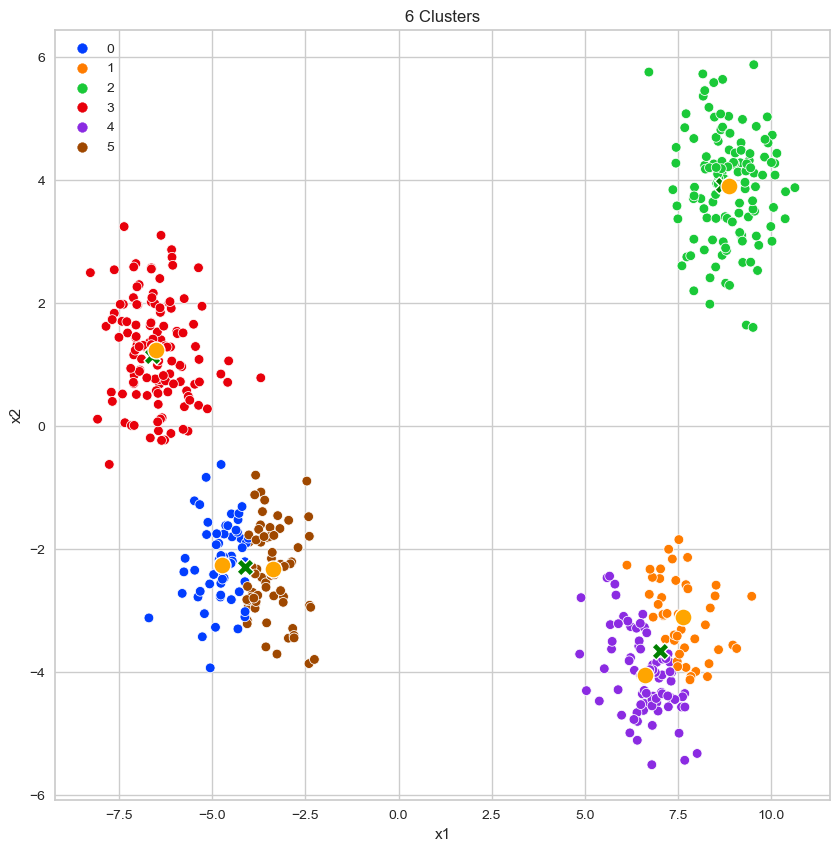

In [29]:
for i in range(3, 7):
    plotClusters(i)

Ahora utilizaremos el método del codo para encontrar el número de clusters sin tener que hacer iteraciones de gráficos.

c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Window

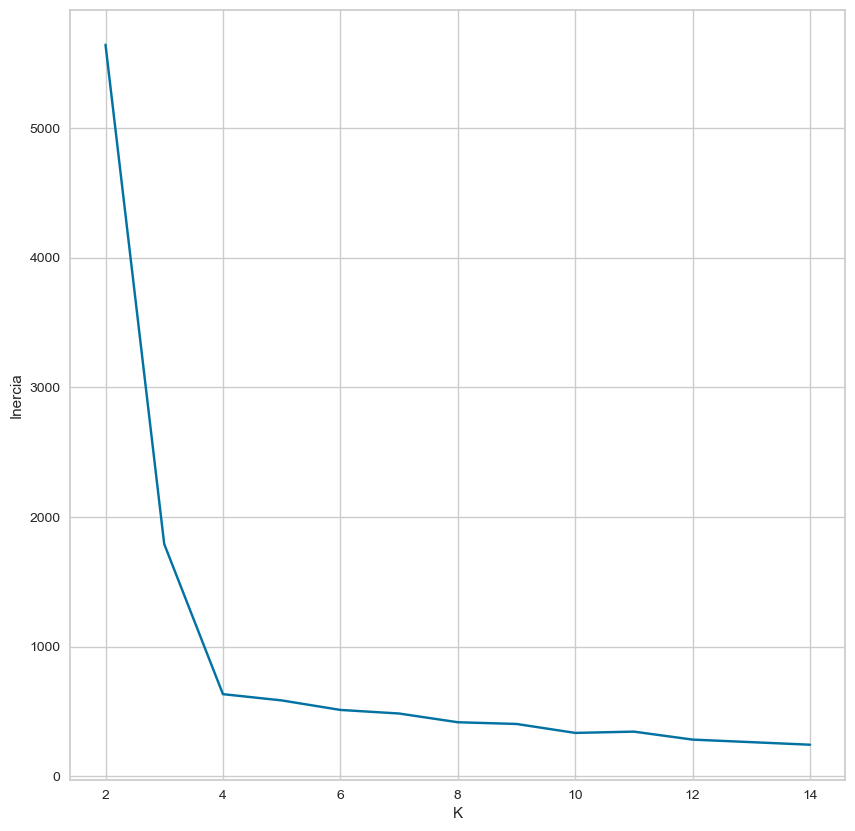

In [30]:
# Suma de los errores cuadráticos
SSE = []
# Posibles clusters
K = range(2, 15)
# Recorremos el rango de K
for k in K:
    # Creamos el modelo de K clusters
    kmeans = KMeans(n_clusters = k, max_iter = 100000, n_init="auto")
    # Entrenamos el modelo
    kmeans = kmeans.fit(X)
    # Calculamos la inercia o suma de los errores cuadráticos y la agregamos a la lista
    SSE.append(kmeans.inertia_)
    
# Hacemos el gráfico del método del codo
plt.figure(figsize = (10, 10))
plt.plot(K, SSE, "bx-")
plt.xlabel("K")
plt.ylabel("Inercia")
plt.show()

También utilizaremos el coeficiente de silueta.

c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Window

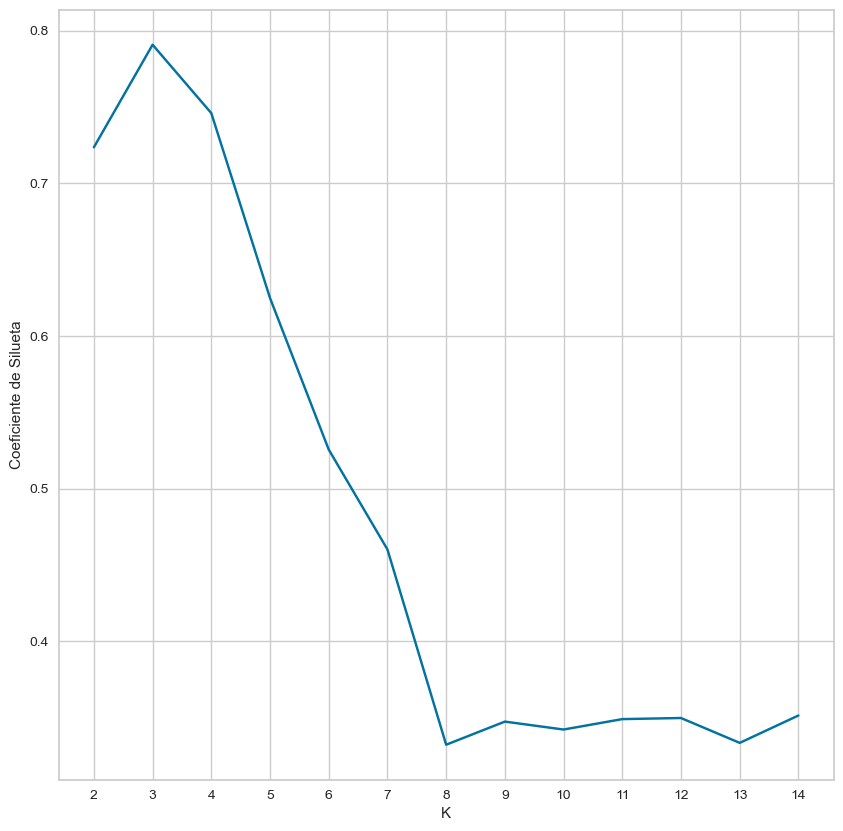

In [31]:
# Coeficiente de silueta
silhouetteScores = []
# Posibles clusters
K = range(2, 15)
# Recorremos el rango de K
for k in K:
    # Creamos el modelo de K clusters
    kmeans = KMeans(n_clusters = k, max_iter = 100000, n_init="auto")
    # Entrenamos el modelo y hacemos predicciones
    predicts = kmeans.fit_predict(X)
    # Calculamos el coeficiente de silueta y lo agregamos a la lista
    silhouetteScores.append(silhouette_score(X, predicts))
    
# Hacemos el gráfico para observar el coeficiente de silueta
plt.figure(figsize = (10, 10))
plt.plot(K, silhouetteScores, "bx-")
plt.xticks(K)
plt.xlabel("K")
plt.ylabel("Coeficiente de Silueta")
plt.show()

##### Evaluación del modelo

c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


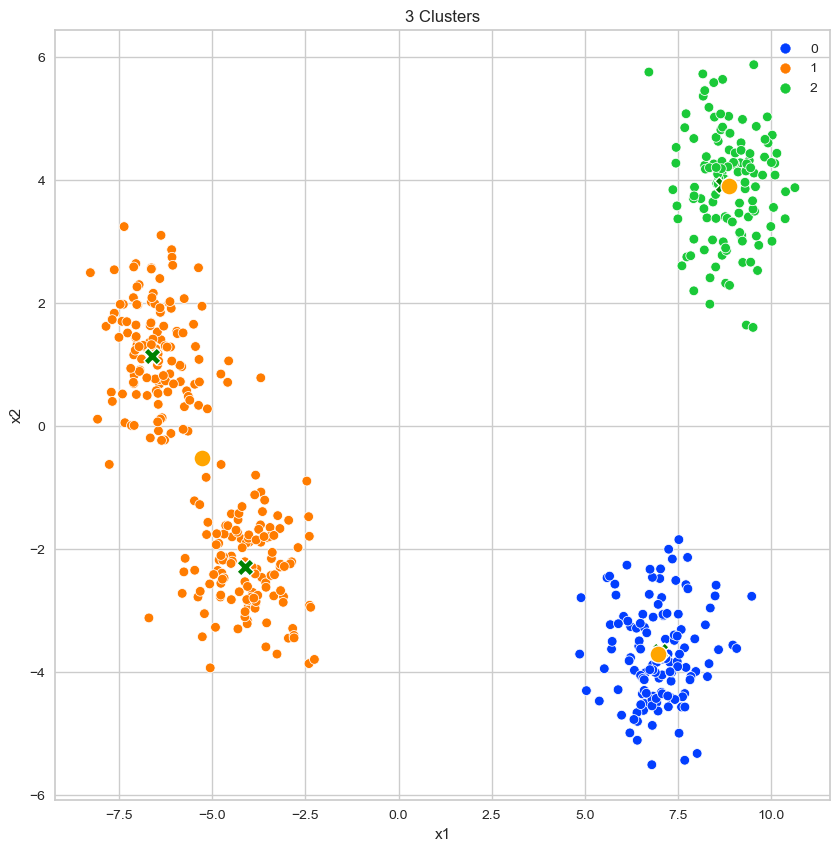

In [32]:
plotClusters(3)

Vamos a graficar utilizando el coeficiente de silueta.

c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
c:\Users\shani\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


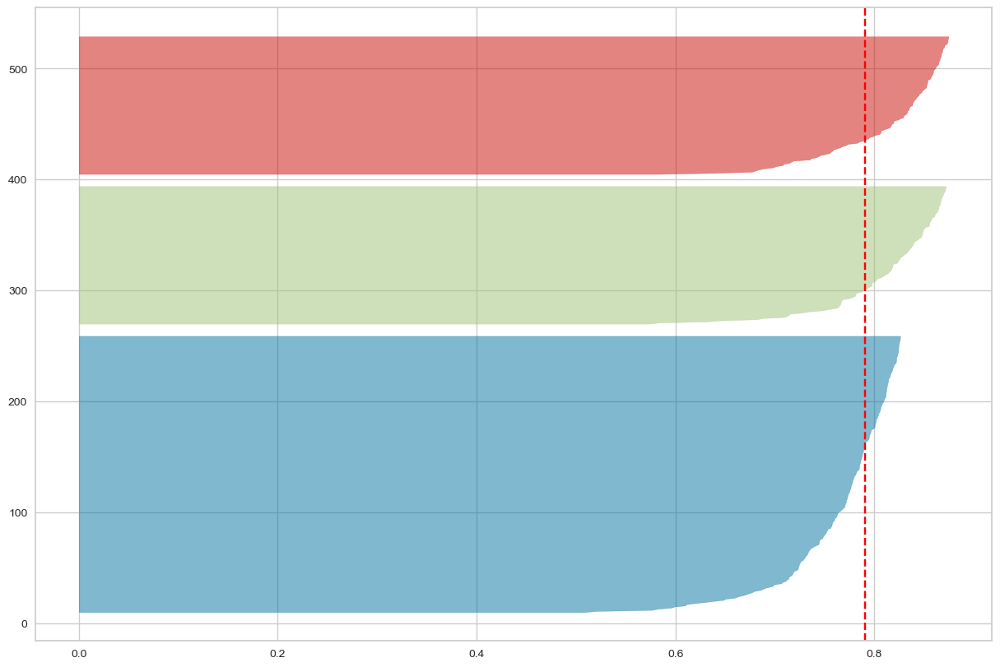

Coeficiente de Silueta: 0.79074477055849


In [33]:
plt.figure(figsize = (15, 10))
kmeans = KMeans(n_clusters = 3, max_iter = 10000, n_init="auto")
# Utilizamos un visualizador del coeficiente de silueta al cual le mandamos el modelo
silhouetteVisualizer = SilhouetteVisualizer(kmeans, colors = "yellowbrick")
# Entrenamos el algoritmo pero desde el visualizador
silhouetteVisualizer.fit(X)
predicts = kmeans.fit_predict(X)
plt.show()
print(f"Coeficiente de Silueta: {silhouette_score(X, predicts)}")
